1. Start the Weaviate instance: `docker compose up`
2. Run code below

In [20]:
import pickle, weaviate, json, os, IPython
import weaviate.classes as wvc

In [42]:
#Connect to the locally launched instance of Weaviate

client = weaviate.connect_to_local(additional_config=wvc.init.AdditionalConfig(timeout=wvc.init.Timeout(init=10)))

print(f"Client created? {client.is_ready()}")

Client created? True


In [44]:
#Make sure that we don't have a class already created

if client.collections.exists("ClipExample"):
    client.collections.delete("ClipExample")
    print('Deleted Clip Example Collection')
    

In [45]:
#Create a class object that uses a multi2vec module
#A multi2vec module understands multiple types of data - there are 

collection = client.collections.create(
        "ClipExample",
        vectorizer_config=wvc.config.Configure.Vectorizer.multi2vec_clip(image_fields=["image"]),
        properties=[  # properties configuration is optional
            wvc.config.Property(name="text", data_type=wvc.config.DataType.TEXT),
            wvc.config.Property(name="image", data_type=wvc.config.DataType.BLOB),
        ]
    )

print("Schema class created")

Schema class created


In [46]:
#Add images to our created class

for img in os.listdir("Images/"):
    print(f"Images/{img}")

    encoded_image = weaviate.util.image_encoder_b64(f"Images/{img}")

    data_properties = {
        "image": encoded_image,
        "text": img,
    }

    collection.data.insert(data_properties)

print("All images added")

Images/Llama_LIL_134178.jpg
Images/Big Sur_ California_LIL_9678.jpg
Images/Cityscape_LIL_134155.jpg
Images/Spiral staircase_LIL_134156.jpg
Images/Cat_LIL_134138.jpg
Images/Microphone_LIL_134215.jpg
Images/On a grassy hill_LIL_134221.jpg
Images/Cherry_LIL_134126.jpg
Images/Joshua Tree and California coast_LIL_9670.jpg
Images/Onlookers contemplating_LIL_134225.jpg
Images/Deer_LIL_134180.jpg
Images/Wearing a white dress _LIL_134222.jpg
Images/Joshua Tree and California coast_LIL_9662.jpg
Images/Dog in motion_LIL_134175.jpg
Images/Conservatory_LIL_9680.jpg
Images/Cats on a chair_LIL_134151.jpg
Images/Pies and dishes_LIL_134217.jpg
Images/Golden Gate Bridge from Presidio_LIL_9682.jpg
Images/Bird feeder_LIL_134172.jpg
Images/Point Reyes_ California_LIL_9672.jpg
Images/Forest_LIL_134133.jpg
Images/Blue sky between skyscrapers_LIL_134160.jpg
Images/Table setting outdoor_LIL_134165.jpg
Images/Single cyclist with land background_LIL_9376.dng
Images/Reading outside_LIL_134129.jpg
Images/Feet unde

In [47]:
#Lets search for images of "dogs"

response = collection.query.near_text(
    query="open sea beach",
    limit=5,
    return_properties=["text"],
    return_metadata=wvc.query.MetadataQuery(distance=True)
)

for o in response.objects:
    print(o.properties)
    print(o.metadata.distance)

{'text': 'Point Reyes_ California_LIL_9672.jpg'}
0.7255123853683472
{'text': 'Big Sur_ California_LIL_9678.jpg'}
0.7380608320236206
{'text': 'Walking dog on beach_LIL_134163.jpg'}
0.7766464948654175
{'text': 'On a grassy hill_LIL_134221.jpg'}
0.7825914621353149
{'text': 'Golden Gate Bridge from Presidio_LIL_9682.jpg'}
0.796714723110199


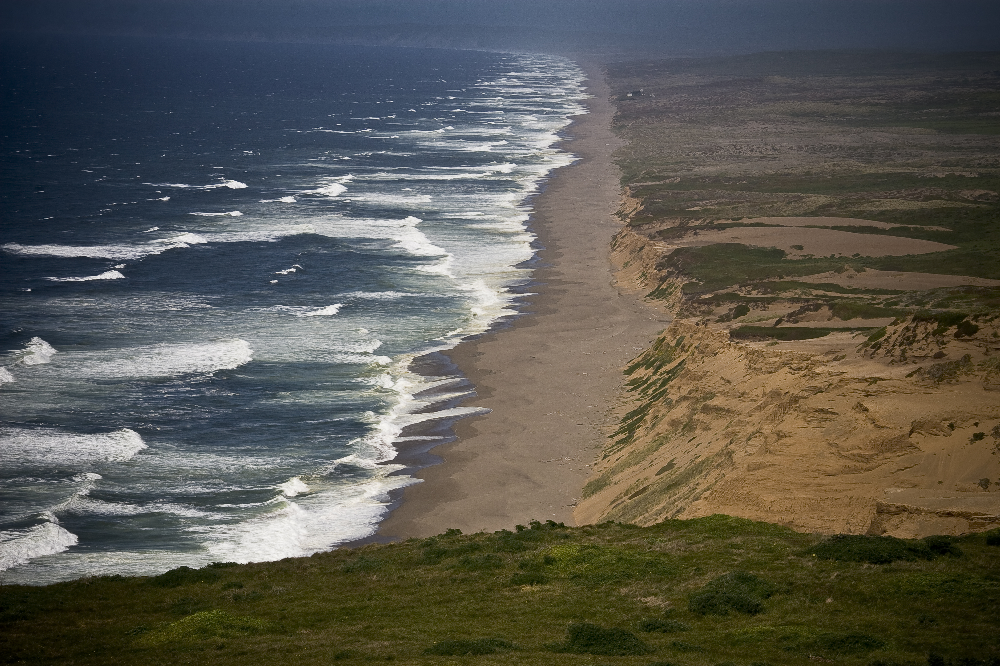

In [48]:
#Lets visualize the images that came back
IPython.display.Image(filename='Images/Point Reyes_ California_LIL_9672.jpg') 

In [54]:
#Lets search for images using a query image

response = collection.query.near_image(
    near_image="./TestImages/Cat outside_LIL_134200.jpg",
    limit=5,
    return_properties=["text"],
    return_metadata=wvc.query.MetadataQuery(distance=True)
)

for o in response.objects:
    print(o.properties)
    print(o.metadata.distance)



{'text': 'Cat_LIL_134138.jpg'}
0.12137973308563232
{'text': 'Cats on a chair_LIL_134151.jpg'}
0.22747862339019775
{'text': 'Bird feeder_LIL_134172.jpg'}
0.2813359498977661
{'text': 'Dog in motion_LIL_134175.jpg'}
0.3113260269165039
{'text': 'Feet under a skirt_LIL_134201.jpg'}
0.31550371646881104


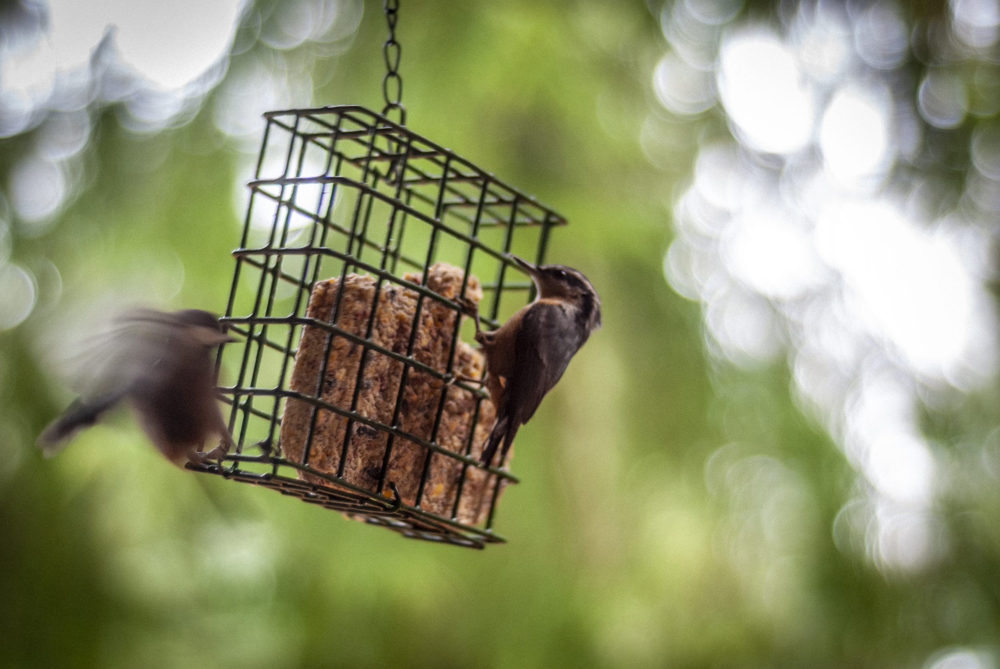

In [57]:
#Lets visualize the images that came back
IPython.display.Image(filename='Images/Bird feeder_LIL_134172.jpg') 

In [41]:
client.close()